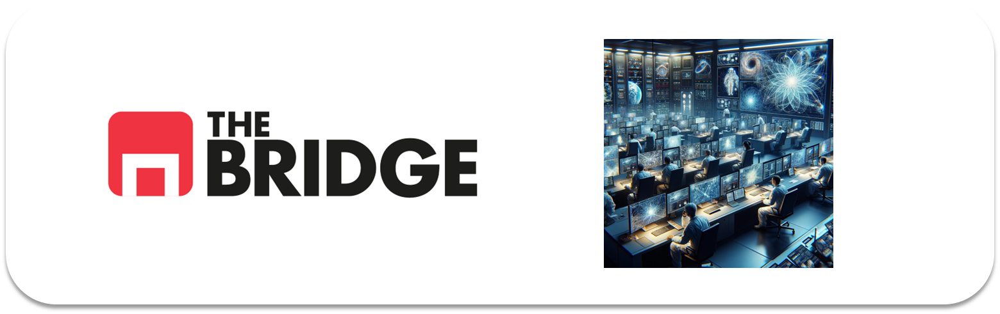

## PRACTICA OBLIGATORIA: **Redes Convolucionales**

* La práctica obligatoria de esta unidad consiste en un ejercicio de construcción de una red convolucional con Keras para la clasificación de imagenes de simpáticos perretes y gatetes. Descarga este notebook en tu ordenador y trabaja en local. Ten en cuenta que tendrás que descar los directorios de imágenes y datos adicionales, si los hubiera.
* Recuerda que debes subirla a tu repositorio personal antes de la sesión en vivo para que puntúe adecuadamente.  
* Recuerda también que no es necesario que esté perfecta, sólo es necesario que se vea el esfuerzo. 
* Esta práctica se resolverá en la sesión en vivo correspondiente y la solución se publicará en el repo del curso. 

### Ejercicio 0

Importa los paquetes y módulos que necesites a lo largo del notebook.

In [1]:
import bootcampviztools as bt
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
# filter warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split

### Problema de Negocio y dataset

Una conocida empresa de información inmobiliaria utiliza un CAPTCHA visual de perros y gatos para detectar webscrappings intensivos y ataques de denegación de servicio. Últimamente, ha detectado que su sistema está empezando a flojear, es decir que hay muchos sistemas de detección automática de imágenes que son capaces de detectar que es un perro y un gato y salterse el CAPTCHA antirobots. Por eso nos ha pedido que entrenemos un modelo potente de clasificación que emule a estos sistemas con el objetivo de emplear como fotografías para el CAPTCHA aquellas que no sepa detectar este sistema emulador de chicos malos.  

Pues manos a la obra, tenemos que seleccionar en un conjunto de 1000 imágenes aquellas que peor se le daría clasificar a un potencial sistema anti-CAPTCHA.  

Para ello vamos a emplear un conjunto de train de 4000 imágenes de perretes y gatetes que se encuentran distribuidas en "data" en cuatro directorios "github_train_0",  "github_train_1", "githun_train_2" y "github_train_3". Los datos de las imagenes que tenemos que clasificar y luego seleccionar como las más "difíciles" están en "data" en el directorio "github_test".


### Se pide

1. Crear los datasets X,y de train y test, leyendo las imágenes de los directorios correspondientes (tendrás que leer todas las imágenes de los cuatro directorios para train) y a la vez que se leen adpatar su resolución para que todas tengan un tamaño de 32x32. En este caso puedes adaptar las funciones de los ejercicios de la unidad. NOTA: Ten en cuenta que la clase a la que pertenece en la foto está en el nombre del archivo.

2. Crea un modelo DL basado en redes convolucionales con al menos dos juegos Convolucional-Pooling. Sigue todo el proceso de ML (visualización del dataset, MiniEDA, Construcción del modelo)

3. Entrenar el modelo con un callback de Earlystopping con paciencia la que tengas :-). Muestra su historial de entrenamiento.

4. Evalua el modelo, haz un reporte de clasificacion y muestra la matriz de confianza.

5. Es el momento de seleccionar las imagenes: Selecciona el 10% de imágenes mal clasificadas de una y otra clase que tengan el mayor nivel de confianza de que pertenencían a la clase errónea. Es decir las imágenes de perros clasificadas como gatos y con la probabilidad de ser perror más alta.


### Extra (para hacer en clase)

Repite los pasos 3 a 5 utilizando el generador de imágenes sintéticas o Image Augmentation de Keras. 



In [2]:
import os
import cv2
import numpy as np
from skimage.io import imread
from pathlib import Path

def read_data(directorio, reshape_dim = (32,32)):
    X = []
    y = []
    for folder in os.listdir(directorio):
        if os.path.isdir('/'.join([directorio, folder])):
            for file in os.listdir('/'.join([directorio, folder])):

                image = imread('/'.join([directorio, folder, file]))
                image = cv2.resize(image, reshape_dim) # Redimensionamos las imágenes a 32x32

                X.append(image)
                y.append(folder)

    return np.array(X),np.array(y)




In [3]:
X, y = read_data("./data")

In [4]:
y

array(['github_test', 'github_test', 'github_test', ..., 'github_train_3',
       'github_train_3', 'github_train_3'], shape=(5000,), dtype='<U14')

In [5]:
print(y.shape)

(5000,)


In [6]:
print(X.shape)

(5000, 32, 32, 3)


In [7]:
print(X.shape)
print(X.dtype)

(5000, 32, 32, 3)
uint8


In [8]:
df = pd.DataFrame(X.reshape(5000, -1))

In [9]:
df

,0,1,2,3,4,5,6,7,8,9,...,3062,3063,3064,3065,3066,3067,3068,3069,3070,3071
0,196,193,175,199,194,175,196,192,173,193,...,188,206,200,187,205,199,185,206,197,184
1,86,91,85,85,90,84,86,89,80,83,...,171,179,166,183,174,162,182,175,161,179
2,193,181,184,199,191,189,206,198,196,210,...,173,181,170,169,155,136,132,144,119,116
3,39,115,145,55,107,131,67,95,108,82,...,129,132,117,104,161,141,123,84,85,79
4,30,38,57,122,103,86,87,56,29,190,...,156,184,173,158,185,179,167,181,168,154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,133,125,140,133,125,140,139,131,142,137,...,33,49,52,50,35,39,38,34,35,36
4996,30,30,18,29,49,30,49,62,37,56,...,76,107,105,84,81,80,59,77,75,61
4997,231,197,159,231,197,159,229,197,158,232,...,184,136,164,165,189,213,223,124,147,178
4998,250,245,246,239,195,179,120,106,79,136,...,79,91,108,94,92,89,82,123,112,110


In [10]:
class_names = ["github_test","github_train_0","github_train_1","github_train_2","github_train_3"]

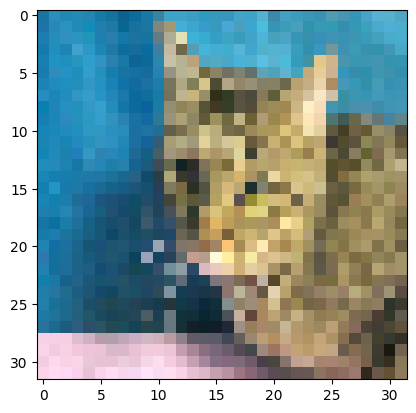

In [11]:
plt.imshow(X[7])
plt.show()

In [12]:
def show_images_batch(clothes, n_cols, labels = [], names = class_names):
    n_rows = ((len(clothes) - 1) // n_cols + 1)
    plt.figure(figsize=(n_cols * 2, n_rows * 2.2))
    for index, cloth in enumerate(clothes):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(cloth, cmap = "Greys")
        plt.axis("off")
        if len(labels):
            plt.title(names[labels[index]])

In [13]:
def show_images_batch(clothes, n_cols, labels=[], names=class_names):
    n_rows = ((len(clothes) - 1) // n_cols + 1)
    plt.figure(figsize=(n_cols * 2, n_rows * 2.2))
    for index, cloth in enumerate(clothes):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(cloth, cmap="Greys")
        plt.axis("off")
        if len(labels):
            plt.title(labels[index])

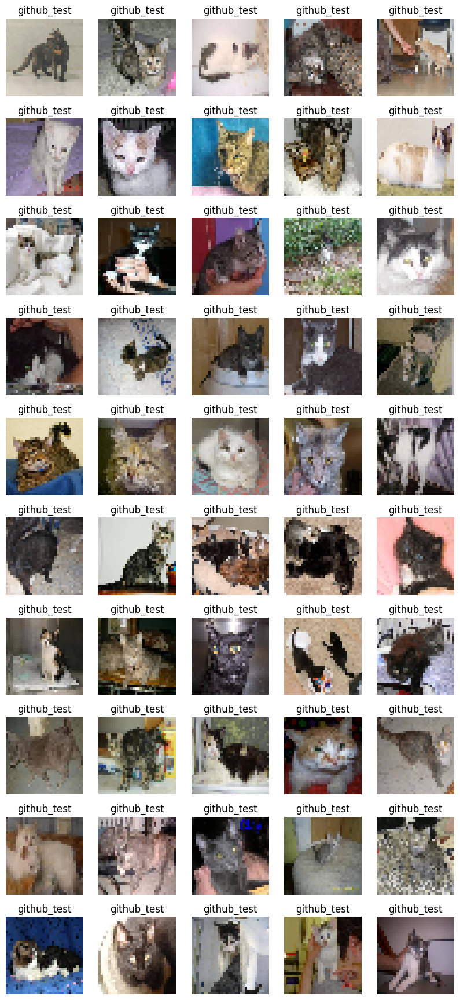

In [14]:
indices = np.random.randint(0,5000,15)
show_images_batch(X[:50], n_cols=5, labels=y[:50])

In [15]:
print(type(y[0]), y[0])


<class 'numpy.str_'> github_test


In [16]:
df

,0,1,2,3,4,5,6,7,8,9,...,3062,3063,3064,3065,3066,3067,3068,3069,3070,3071
0,196,193,175,199,194,175,196,192,173,193,...,188,206,200,187,205,199,185,206,197,184
1,86,91,85,85,90,84,86,89,80,83,...,171,179,166,183,174,162,182,175,161,179
2,193,181,184,199,191,189,206,198,196,210,...,173,181,170,169,155,136,132,144,119,116
3,39,115,145,55,107,131,67,95,108,82,...,129,132,117,104,161,141,123,84,85,79
4,30,38,57,122,103,86,87,56,29,190,...,156,184,173,158,185,179,167,181,168,154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,133,125,140,133,125,140,139,131,142,137,...,33,49,52,50,35,39,38,34,35,36
4996,30,30,18,29,49,30,49,62,37,56,...,76,107,105,84,81,80,59,77,75,61
4997,231,197,159,231,197,159,229,197,158,232,...,184,136,164,165,189,213,223,124,147,178
4998,250,245,246,239,195,179,120,106,79,136,...,79,91,108,94,92,89,82,123,112,110


In [17]:
df["Archivo"] = y

In [18]:
df

,0,1,2,3,4,5,6,7,8,9,...,3063,3064,3065,3066,3067,3068,3069,3070,3071,Archivo
0,196,193,175,199,194,175,196,192,173,193,...,206,200,187,205,199,185,206,197,184,github_test
1,86,91,85,85,90,84,86,89,80,83,...,179,166,183,174,162,182,175,161,179,github_test
2,193,181,184,199,191,189,206,198,196,210,...,181,170,169,155,136,132,144,119,116,github_test
3,39,115,145,55,107,131,67,95,108,82,...,132,117,104,161,141,123,84,85,79,github_test
4,30,38,57,122,103,86,87,56,29,190,...,184,173,158,185,179,167,181,168,154,github_test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,133,125,140,133,125,140,139,131,142,137,...,49,52,50,35,39,38,34,35,36,github_train_3
4996,30,30,18,29,49,30,49,62,37,56,...,107,105,84,81,80,59,77,75,61,github_train_3
4997,231,197,159,231,197,159,229,197,158,232,...,136,164,165,189,213,223,124,147,178,github_train_3
4998,250,245,246,239,195,179,120,106,79,136,...,91,108,94,92,89,82,123,112,110,github_train_3


In [19]:
test_set = df.loc[df["Archivo"].str.contains("github_test")]
train_set = df.loc[~df["Archivo"].str.contains("github_test")]
target = ["Archivo"]

In [20]:
test_set

,0,1,2,3,4,5,6,7,8,9,...,3063,3064,3065,3066,3067,3068,3069,3070,3071,Archivo
0,196,193,175,199,194,175,196,192,173,193,...,206,200,187,205,199,185,206,197,184,github_test
1,86,91,85,85,90,84,86,89,80,83,...,179,166,183,174,162,182,175,161,179,github_test
2,193,181,184,199,191,189,206,198,196,210,...,181,170,169,155,136,132,144,119,116,github_test
3,39,115,145,55,107,131,67,95,108,82,...,132,117,104,161,141,123,84,85,79,github_test
4,30,38,57,122,103,86,87,56,29,190,...,184,173,158,185,179,167,181,168,154,github_test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,51,27,11,81,53,25,109,69,34,110,...,125,88,59,121,85,52,114,76,55,github_test
996,9,10,5,3,1,4,20,20,13,13,...,118,88,56,106,74,53,72,51,34,github_test
997,38,88,165,43,91,168,44,89,179,45,...,102,92,79,34,37,39,27,38,72,github_test
998,87,99,84,95,107,93,94,106,92,95,...,75,72,61,85,73,62,90,83,70,github_test


In [21]:
train_set

,0,1,2,3,4,5,6,7,8,9,...,3063,3064,3065,3066,3067,3068,3069,3070,3071,Archivo
1000,126,100,64,118,92,53,129,104,63,174,...,86,72,46,116,101,77,94,82,55,github_train_0
1001,218,47,83,206,26,63,216,63,91,207,...,210,26,67,213,21,62,211,19,57,github_train_0
1002,209,176,157,205,172,153,196,163,146,183,...,88,62,37,84,57,34,63,39,23,github_train_0
1003,7,7,7,10,10,10,13,16,15,23,...,1,1,1,18,15,8,81,52,26,github_train_0
1004,159,149,139,166,156,146,203,200,207,89,...,144,141,124,173,169,158,170,161,155,github_train_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,133,125,140,133,125,140,139,131,142,137,...,49,52,50,35,39,38,34,35,36,github_train_3
4996,30,30,18,29,49,30,49,62,37,56,...,107,105,84,81,80,59,77,75,61,github_train_3
4997,231,197,159,231,197,159,229,197,158,232,...,136,164,165,189,213,223,124,147,178,github_train_3
4998,250,245,246,239,195,179,120,106,79,136,...,91,108,94,92,89,82,123,112,110,github_train_3


In [22]:
X_train = train_set.drop(target,axis =1)/255
y_train = train_set[target]
X_test = test_set.drop(target,axis = 1)/255
y_test = test_set[target]

In [23]:
X_train = X_train.values.reshape(-1,32,32)
X_test = X_test.values.reshape(-1,32,32)

In [24]:
y_train[100:105].values

array([['github_train_0'],
       ['github_train_0'],
       ['github_train_0'],
       ['github_train_0'],
       ['github_train_0']], dtype=object)

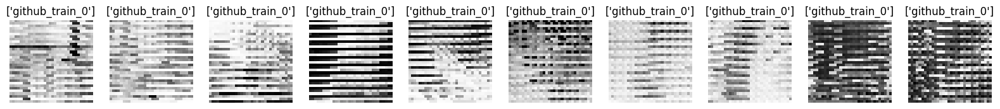

In [25]:
show_images_batch(X_train[100:110], n_cols=10, labels=y_train[100:110].values)


In [26]:
# Me sale feo y no entiendo por que, continuo con la practica para aunque sea tocar el modelo de procesado

In [27]:
from keras.models import Sequential 
model = Sequential() 

In [29]:
from keras.layers import Conv2D
model.add(Conv2D(filters = 8, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu', input_shape = (28,28,1)))

In [30]:
from keras.layers import MaxPool2D # Esta es la clase que corresponde a las capas de Pooling que hacen maxpooling sobre datos de entrada en 2D
model.add(MaxPool2D(pool_size=(2,2), strides = (2,2)))

In [31]:
from keras.layers import Dropout

model.add(Dropout(rate= 0.25))

In [32]:
model.add(Conv2D(filters = 16, kernel_size = (3,3),padding = 'Same', 
                 activation ='relu'))
# Resolución a la salida: Igual stride(1,1) -> 14x14
model.add(MaxPool2D(pool_size=(2,2), strides=(2,2)))
# Resolución a la salida: 14/2 x 14/2 -> 7x7
model.add(Dropout(0.25))

In [33]:
from keras.layers import Flatten, Dense

print("Entrada de la capa flatten:", model.output_shape)
model.add(Flatten()) # 49 features * Número de filtros o mapas de características -> 49*16 = 784 features -> Volvemos a las features de entrada, esto es muy típico
print("Salida de la capa flatten:",model.output_shape)
model.add(Dense(256, activation = "relu"))
# Pesos aquí (49*16+1)*256
model.add(Dropout(0.5))
model.add(Dense(10, activation = "softmax"))
# Pesos aquí (256+1)*10


Entrada de la capa flatten: (None, 7, 7, 16)
Salida de la capa flatten: (None, 784)


In [34]:
from keras.optimizers import Adam

optimizer = Adam(learning_rate =0.001, beta_1=0.9, beta_2=0.999)

In [35]:
model.compile(optimizer = optimizer , loss = "sparse_categorical_crossentropy", metrics=["accuracy"])

In [36]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 28, 28, 8)      │           208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 14, 14, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 14, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 7, 7, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       200,960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 204,906 (800.41 KB)

 Trainable params: 204,906 (800.41 KB)

 Non-trainable params: 0 (0.00 B)

In [37]:
batch_size = 128
epochs = 10
validation_split = 0.2

In [38]:
history = model.fit(X_train, y_train, batch_size = batch_size, epochs= epochs, validation_split= validation_split)

ValueError: Invalid dtype: object

In [ ]:
#No se a que se refiere el tipo objeto, dado que en el train no conserva la etiqueta, por lo que no deberia entrar en conflicto....

#Tratare de ver la live review para intentar ubicar donde me he equivocado